In [117]:
library(tidyverse)
library(DBI)
library(duckdb)
library(purrr)
library(jsonlite)
library(stringr)

In [118]:
theme_set(theme_minimal())

In [159]:
# make config dataframe
print(getwd())
path <- "../data/configs/"
files <- dir(path, pattern = "*.json")

data <- files %>%
       map_df(~fromJSON(file.path(path, .), flatten = TRUE))

run_params<-data %>% 
select(name, n_shippers, n_carriers) %>%
mutate(run = as.numeric( str_replace( substr(name, 5,7),"_","") ))

[1] "/home/jovyan/abm/notebooks"


In [119]:
con = dbConnect(duckdb::duckdb(), ":memory:")

In [133]:

df_status_pct <- dbGetQuery(con, 
                  "SELECT 
                    filename,
                    AgentID,
                    carrier_status,
                    count(*)  as steps_in_state
                   FROM read_parquet('../data/results/df_adata_exp1_*.parquet', filename=true)
                   WHERE agent_type = 'CarrierAgent'
                   GROUP BY 1,2,3
                    
;")

In [138]:
shortys = df_status_pct %>%
group_by(filename, AgentID) %>%
summarize(total_steps = sum(steps_in_state)) %>%
summarize(max_steps = max(total_steps)) %>%
filter(max_steps == 30) %>%
pull(filename)

`summarise()` has grouped output by 'filename'. You can override using the `.groups` argument.



In [140]:
df_status_pct <- df_status_pct %>%
mutate(run = as.numeric( str_replace( substr(filename, 31,32),"_","") )) %>%
filter(!filename %in% shortys)

In [141]:
tmp_files <- df_status_pct %>% 
group_by(run, AgentID) %>%
summarize(total_steps = sum(steps_in_state)) %>%
summarize(run_steps = max(total_steps)) 

tmp_files

`summarise()` has grouped output by 'run'. You can override using the `.groups` argument.



run,run_steps
<dbl>,<dbl>
0,3000
1,3000
2,3000
3,3000
4,3000
5,3000
6,3000
7,3000
8,3000


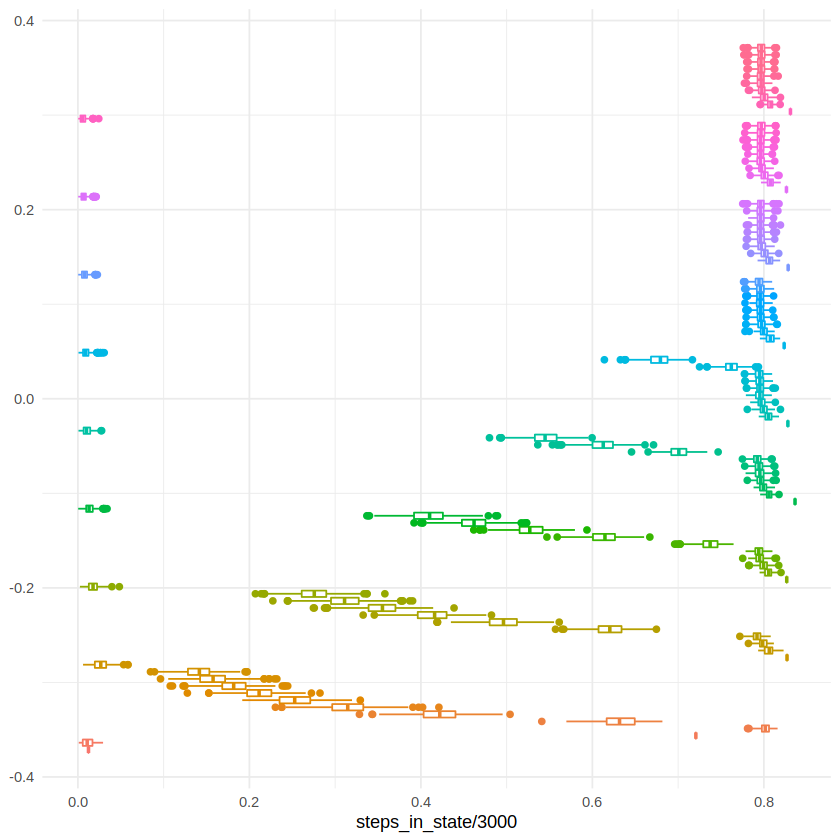

In [160]:
df_status_pct %>%
filter(carrier_status == 'in transit') %>%
ggplot(aes(x = steps_in_state/3000, color = filename))+
geom_boxplot()+
theme(legend.position = 'None')

In [162]:
df_status_pct %>%
head()

,filename,AgentID,carrier_status,steps_in_state,run
,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,../data/results/df_adata_exp1_12_asof_2023-01-08T22:31:15.139652_run_2023-01-08T22:58:04.256490.parquet,35,searching,613,12
2,../data/results/df_adata_exp1_12_asof_2023-01-08T22:31:15.139652_run_2023-01-08T22:58:04.256490.parquet,36,searching,348,12
3,../data/results/df_adata_exp1_12_asof_2023-01-08T22:31:15.139652_run_2023-01-08T22:58:04.256490.parquet,38,searching,588,12
4,../data/results/df_adata_exp1_12_asof_2023-01-08T22:31:15.139652_run_2023-01-08T22:58:04.256490.parquet,41,searching,449,12
5,../data/results/df_adata_exp1_12_asof_2023-01-08T22:31:15.139652_run_2023-01-08T22:58:04.256490.parquet,43,deadheading,640,12
6,../data/results/df_adata_exp1_12_asof_2023-01-08T22:31:15.139652_run_2023-01-08T22:58:04.256490.parquet,44,searching,480,12


`summarise()` has grouped output by 'run'. You can override using the `.groups` argument.



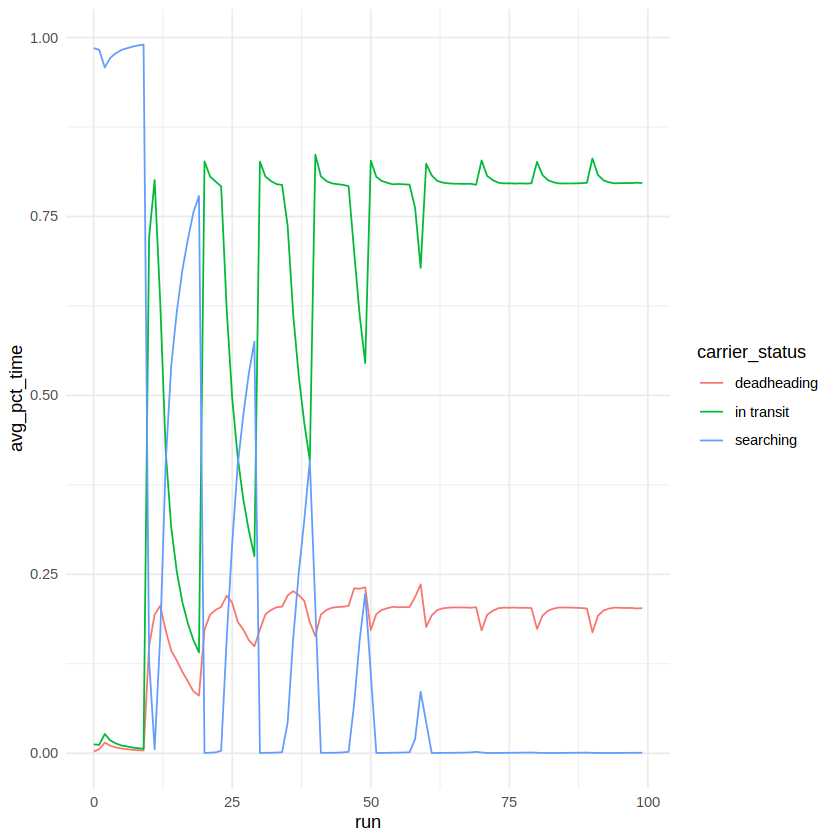

In [163]:
df_status_pct %>%
filter(carrier_status %in% c('in transit', 'searching','deadheading')) %>%
    group_by(run, carrier_status) %>%
    summarize(avg_pct_time = mean(steps_in_state/3000, na.rm = T)) %>%
    ungroup() %>%
    ggplot(aes(x = run, y = avg_pct_time, color = carrier_status)) +
           geom_line()

`summarise()` has grouped output by 'run'. You can override using the `.groups` argument.

Joining, by = "run"



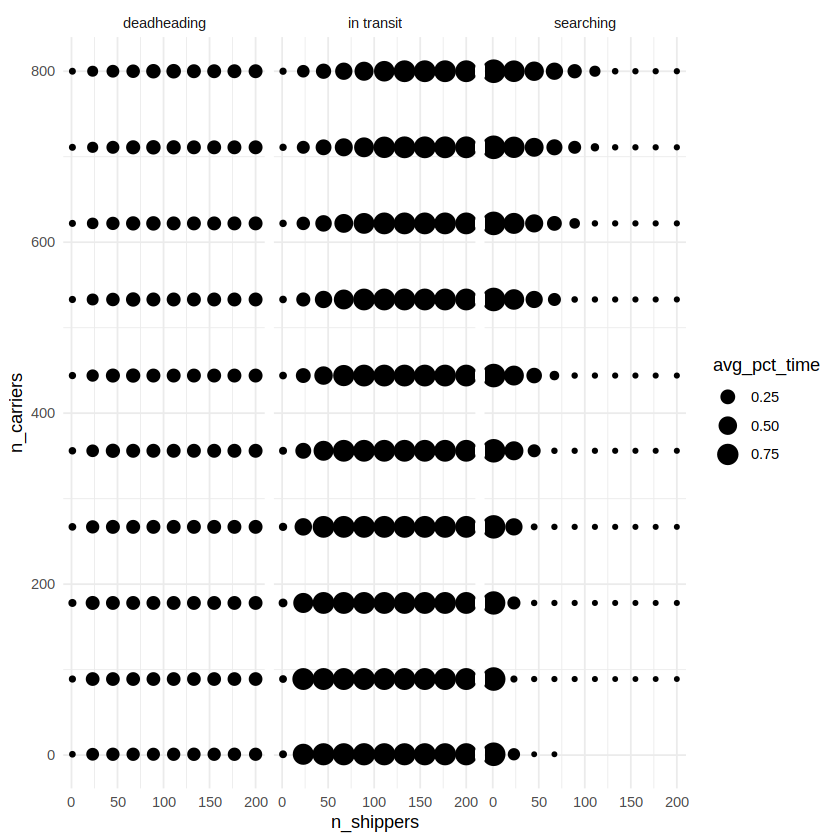

In [167]:
df_status_pct %>%
filter(carrier_status %in% c('in transit', 'searching','deadheading')) %>%
    group_by(run, carrier_status) %>%
    summarize(avg_pct_time = mean(steps_in_state/3000, na.rm = T)) %>%
    ungroup() %>%
left_join(run_params) %>%
ggplot(aes(x = n_shippers, y = n_carriers, size = avg_pct_time))+
geom_point()+
scale_color_viridis_d()+
facet_wrap(~carrier_status)
# head()

In [175]:
options(repr.plot.width=10, repr.plot.height=4)

`summarise()` has grouped output by 'run'. You can override using the `.groups` argument.

Joining, by = "run"



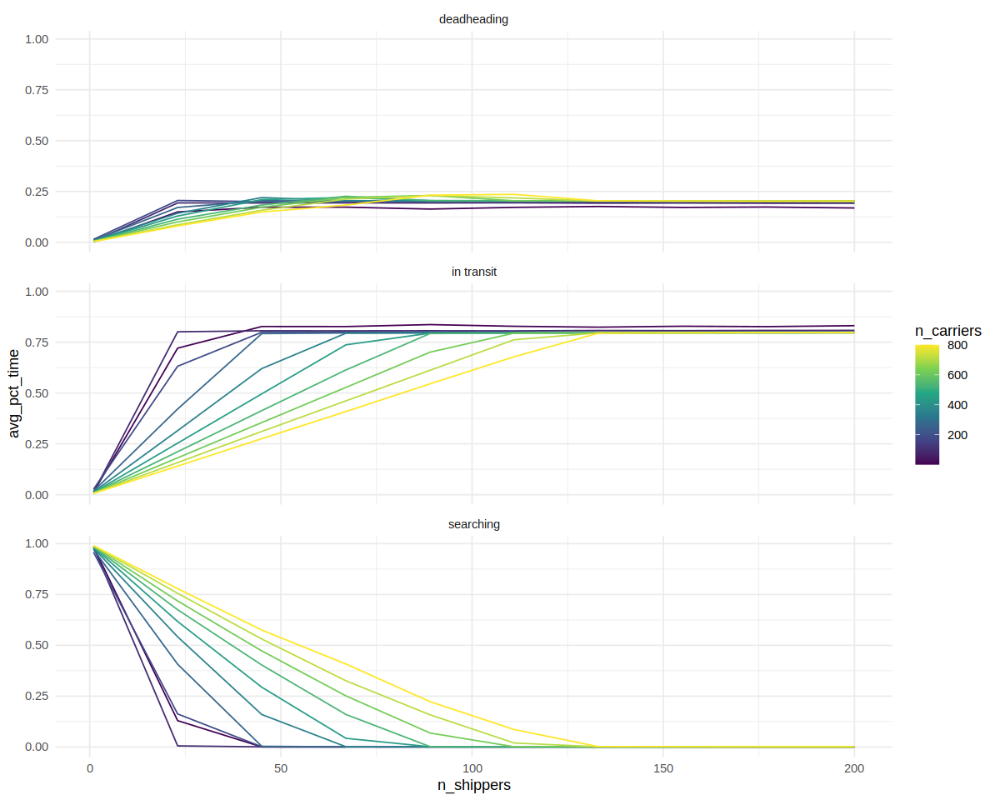

In [179]:
options(repr.plot.width=10, repr.plot.height=8)

df_status_pct %>%
filter(carrier_status %in% c('in transit', 'searching','deadheading')) %>%
    group_by(run, carrier_status) %>%
    summarize(avg_pct_time = mean(steps_in_state/3000, na.rm = T)) %>%
    ungroup() %>%
left_join(run_params) %>%
ggplot(aes(x = n_shippers, y = avg_pct_time, color = n_carriers, group = n_carriers))+
geom_line()+
facet_wrap(~carrier_status, ncol = 1)+
scale_color_viridis_c()

deadheading has a relatively low cap, because the search radius is fixed

`summarise()` has grouped output by 'run'. You can override using the `.groups` argument.

Joining, by = "run"



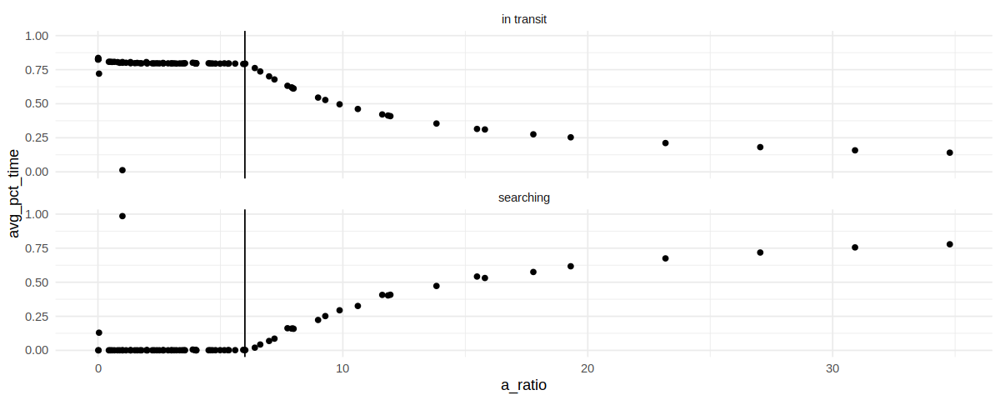

In [188]:
options(repr.plot.width=10, repr.plot.height=4)

df_status_pct %>%
filter(carrier_status %in% c('in transit', 'searching')) %>%
    group_by(run, carrier_status) %>%
    summarize(avg_pct_time = mean(steps_in_state/3000, na.rm = T)) %>%
    ungroup() %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers) %>%
filter(a_ratio < 50) %>%
ggplot(aes(x = a_ratio, y = avg_pct_time))+
geom_point()+
facet_wrap(~carrier_status, ncol = 1)+
geom_vline(xintercept = 6)+
scale_color_viridis_c()

the ratio does make some nice looking behaviors. There's a saturation point where they're never searching. Looks like you could figure out what it is, then you've got some nice plateauing slope. 
so why does the search percent time plateau as low as it does? Probably didn't have a truly high enough ratio of carriers to shippers. The single shipper to x carrier set hits close to the 100% searching

Joining, by = "run"



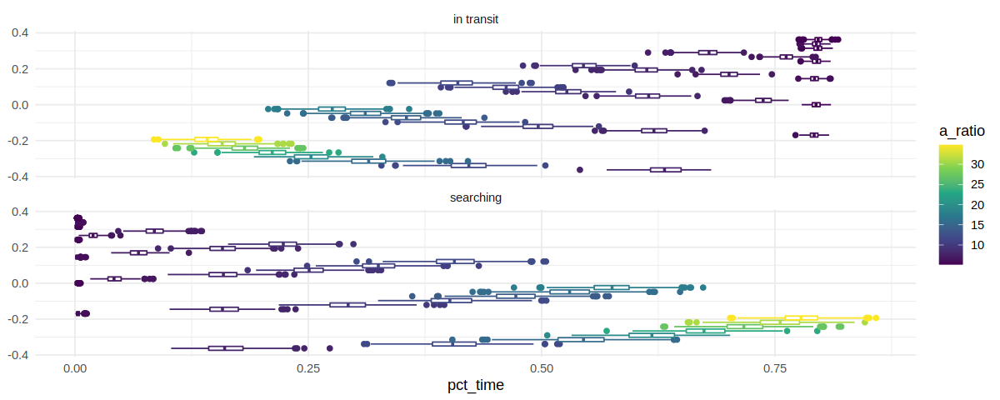

In [197]:
options(repr.plot.width=10, repr.plot.height=4)

df_status_pct %>%
filter(carrier_status %in% c('in transit', 'searching')) %>%
    # group_by(run, carrier_status) %>%
    # summarize(avg_pct_time = mean(steps_in_state/3000, na.rm = T)) %>%
    # ungroup() %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers,
      pct_time = steps_in_state/3000) %>%
filter(a_ratio < 50,
      a_ratio > 5) %>%
ggplot(aes(x =pct_time, color = a_ratio, group = run))+
geom_boxplot()+
facet_wrap(~carrier_status, ncol = 1)+
scale_color_viridis_c()

Joining, by = "run"

`summarise()` has grouped output by 'run', 'carrier_status'. You can override using the `.groups` argument.



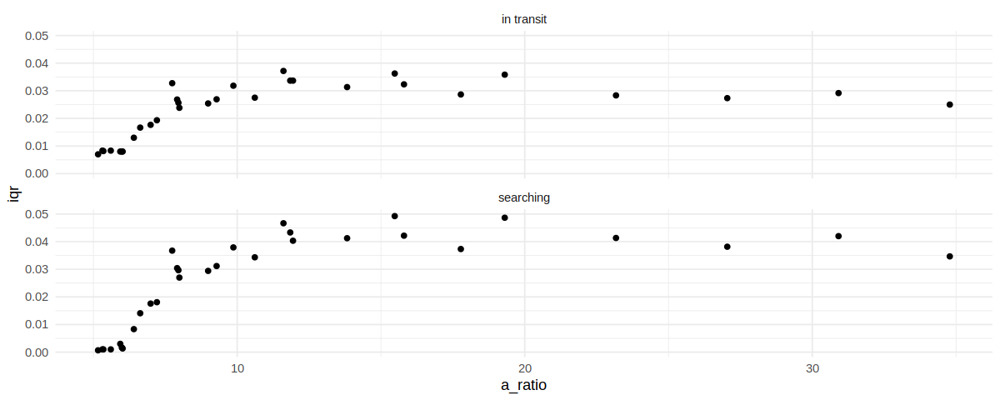

In [221]:
df_status_pct %>%
filter(carrier_status %in% c('in transit', 'searching')) %>%
    # group_by(run, carrier_status) %>%
    # summarize(avg_pct_time = mean(steps_in_state/3000, na.rm = T)) %>%
    # ungroup() %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers,
      pct_time = steps_in_state/3000) %>%
group_by(run, carrier_status, a_ratio) %>%
summarize( 
    pct_time_75 = quantile(pct_time, 0.75),
    pct_time_50 = quantile(pct_time, 0.50), 
    pct_time_25 = quantile(pct_time, 0.25),
    mean_pct_time = mean(pct_time),
    iqr = (quantile(pct_time, 0.75)-quantile(pct_time, 0.25)) )%>%
filter(a_ratio < 50,
      a_ratio > 5) %>%
# head()
ggplot(aes(x = a_ratio))+
# geom_line(aes(y = pct_time_75))+
# geom_line(aes(y = pct_time_50))+
# geom_line(aes(y = pct_time_25))+
# geom_line(aes(y = mean_pct_time), color= 'blue')+
geom_point(aes(y = iqr))+
facet_wrap(~carrier_status, nrow=2)

IQR increases to a plateu - Kinda gets there at the ratio point as the overall averages

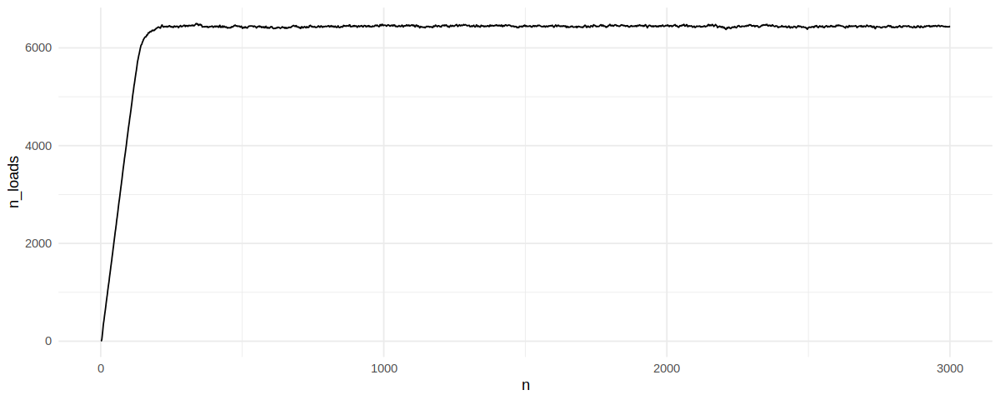

In [222]:
# abm/data/results/df_mdata_exp1_80_asof_2023-01-03T03:49:43.523495_run_2023-01-03T07:26:33.057588.parquet
dbGetQuery(con, 
                  "SELECT * 
                   FROM read_parquet('../data/results/df_mdata_exp1_66_*.parquet', filename=true)                
;") %>%mutate(n = row_number()) %>%

ggplot(aes(x = n, y = n_loads) ) +
geom_line()

In [228]:
mdata <- dbGetQuery(con, 
                  "SELECT * 
                   FROM read_parquet('../data/results/df_mdata_exp1_*.parquet', filename=true)                
;") 

In [233]:
mdata <- mdata %>%
mutate(run = as.numeric( str_replace( substr(filename, 31,32),"_","") )) %>%
group_by(filename, run) %>%
filter(n() > 30) %>%
ungroup()

Joining, by = "run"



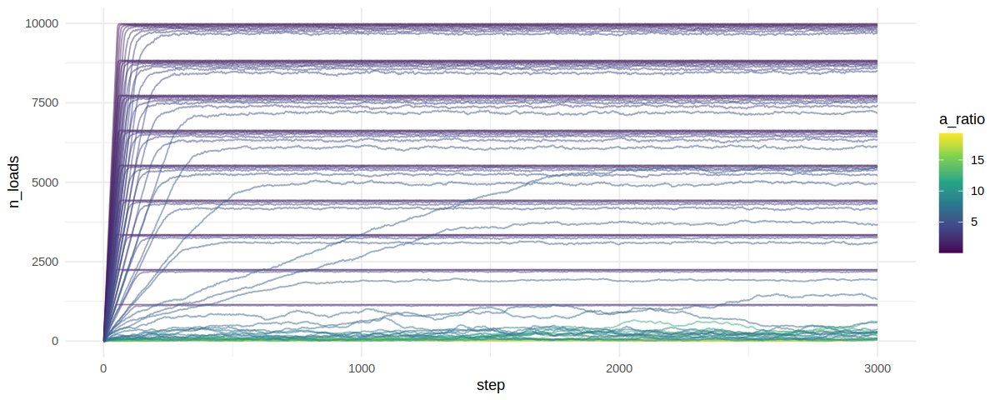

In [241]:
mdata %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers) %>%
group_by(filename, run) %>%
mutate(step = row_number()) %>% 
ungroup() %>%
filter(a_ratio < 20) %>%
ggplot(aes(x = step, y = n_loads, group = run, color = a_ratio))+
geom_line(alpha = 0.5)+
scale_color_viridis_c()

Makes sense - keep going until hit the unbooked load cap for the shippers * n shippers. Different rates to get there then levels off. I want some kind of phase diagram

Joining, by = "run"



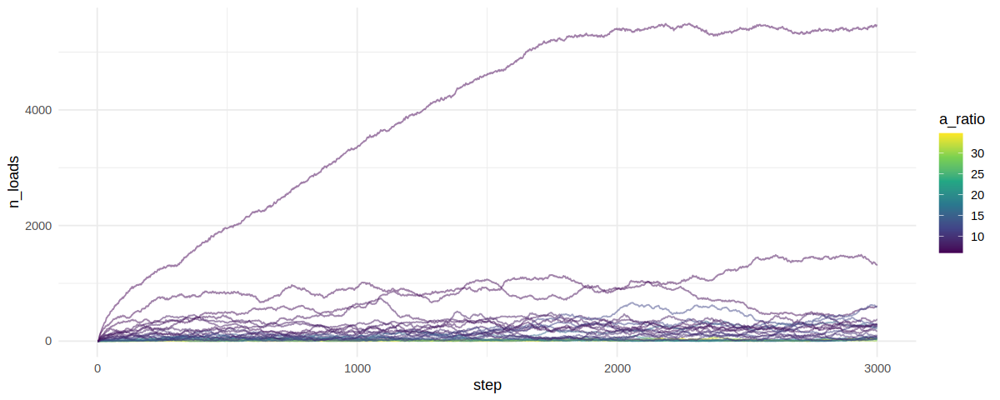

In [245]:
mdata %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers) %>%
group_by(filename, run) %>%
mutate(step = row_number()) %>% 
ungroup() %>%
filter(a_ratio < 50,
      a_ratio > 6
      ) %>%
ggplot(aes(x = step, y = n_loads, group = run, color = a_ratio))+
geom_line(alpha = 0.5)+
scale_color_viridis_c()

Joining, by = "run"



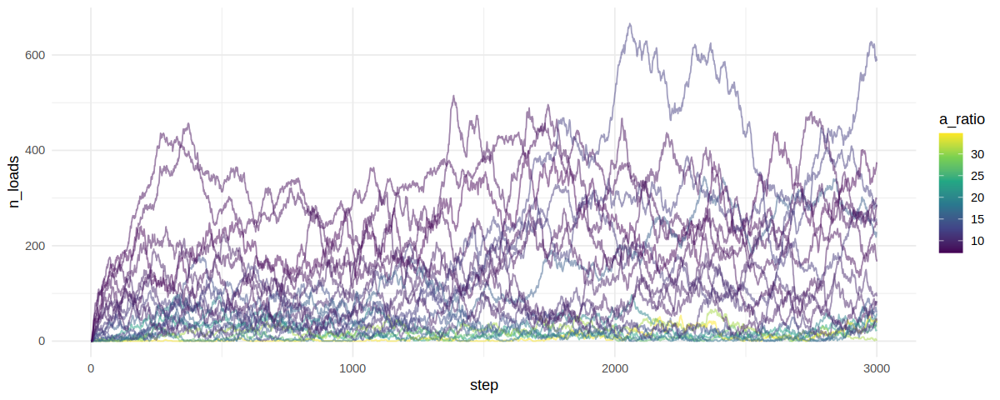

In [246]:
mdata %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers) %>%
group_by(filename, run) %>%
mutate(step = row_number()) %>% 
ungroup() %>%
filter(a_ratio < 50,
      a_ratio > 7 # same tipping point from above
      ) %>%
ggplot(aes(x = step, y = n_loads, group = run, color = a_ratio))+
geom_line(alpha = 0.5)+
scale_color_viridis_c()

Joining, by = "run"



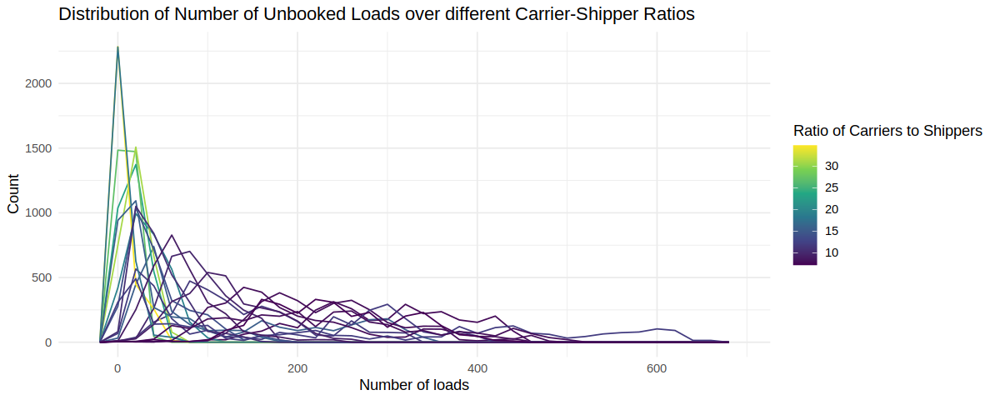

In [261]:
mdata %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers) %>%
group_by(filename, run) %>%
mutate(step = row_number()) %>% 
ungroup() %>%
filter(a_ratio < 50,
      a_ratio > 7 # same tipping point from above
      ) %>%
# group_by(run, n_carriers, n_shippers, a_ratio) %>%
# summarize(peak_unbooked =  max(n_loads) )
ggplot(aes(x = n_loads, group = run, color = a_ratio))+
geom_freqpoly(binwidth=20)+
scale_color_viridis_c()+
labs(title = "Distribution of Number of Unbooked Loads over different Carrier-Shipper Ratios",
     x = "Number of loads", y = "Count", color = "Ratio of Carriers to Shippers")

As you get closer to the saturation point the tail gets longer. 
Note that there is no load preference or discrimination between loads. You get the long tail just due to scarcity.
Would be interesting to see if load discrimination or geographic concentration makes that tail longer.

In [254]:
run_params %>%
mutate(a_ratio = n_carriers / n_shippers)

name,n_shippers,n_carriers,run,a_ratio
<chr>,<int>,<int>,<dbl>,<dbl>
exp1_0,1,1,0,1.00000000
exp1_1,1,89,1,89.00000000
exp1_10,23,1,10,0.04347826
exp1_11,23,89,11,3.86956522
exp1_12,23,178,12,7.73913043
exp1_13,23,267,13,11.60869565
exp1_14,23,356,14,15.47826087
exp1_15,23,444,15,19.30434783
exp1_16,23,533,16,23.17391304


Joining, by = "run"

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



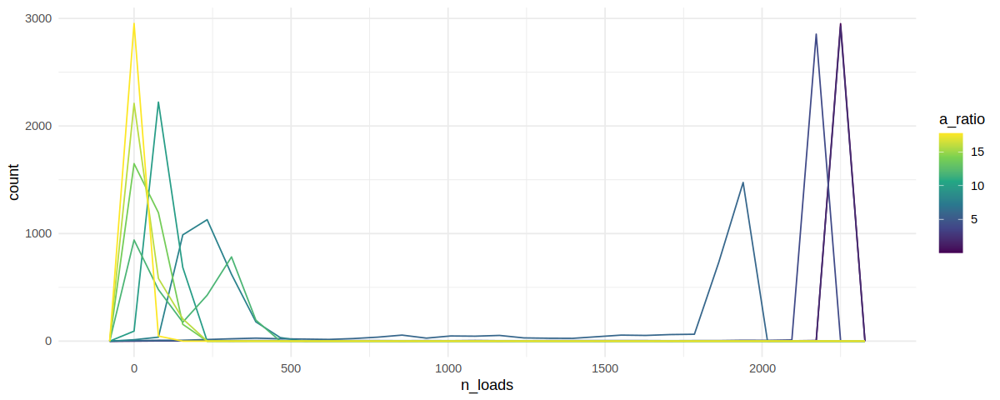

In [256]:
mdata %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers) %>%
filter(n_shippers == 45) %>%
group_by(filename, run) %>%
mutate(step = row_number()) %>% 
ungroup() %>%
ggplot(aes(x = n_loads, group = run, color = a_ratio))+
geom_freqpoly()+
scale_color_viridis_c()

Feels kinda like a beta distribution but not really. But when the ratio is above the tipping point you get something like a gamma

Joining, by = "run"



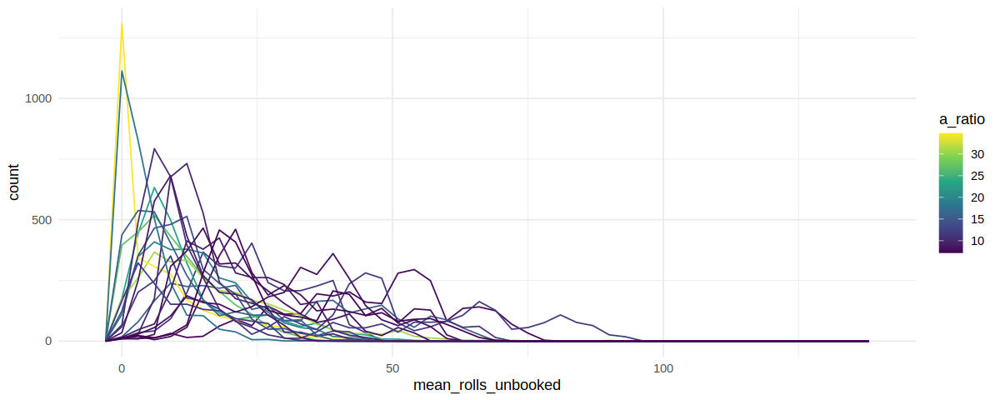

In [266]:
mdata %>%
left_join(run_params) %>%
mutate(a_ratio = n_carriers / n_shippers) %>%
group_by(filename, run) %>%
mutate(step = row_number()) %>% 
ungroup() %>%
filter(a_ratio < 50,
      a_ratio > 7 # same tipping point from above
      ) %>%
# head()
# group_by(run, n_carriers, n_shippers, a_ratio) %>%
# summarize(peak_unbooked =  max(n_loads) )
ggplot(aes(x = mean_rolls_unbooked, group = run, color = a_ratio))+
geom_freqpoly(binwidth=3)+
scale_color_viridis_c()

Number of unbooked loads would be tricky to measure in a growing firm. Rolls might tell more about the external market?

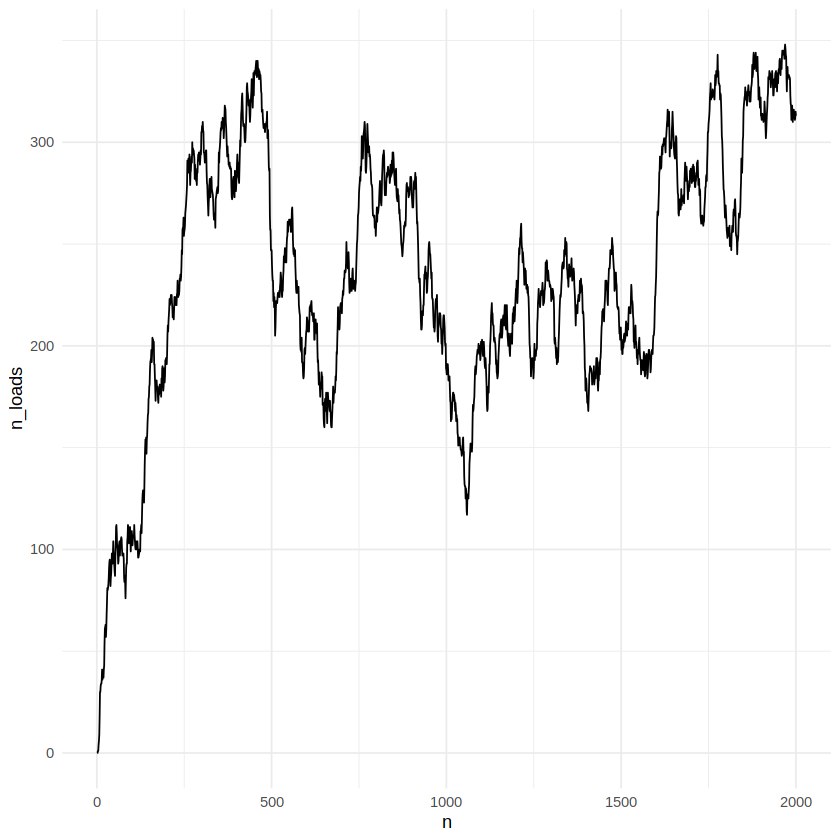

In [39]:
tmp %>%
mutate(n = row_number()) %>%

ggplot(aes(x = n, y = n_loads) ) +
geom_line()
# head()

In [55]:
con = dbConnect(duckdb::duckdb(), ":memory:")
tmp <- dbGetQuery(con, 
                  "SELECT * 
                   FROM read_parquet('../data/results/df_adata_*_run_2023-01-08*.parquet', filename=true)
                    
;")

In [56]:
tmp %>% head()

,agent_type,carrier_loads_moved,carrier_status,Step,AgentID,filename
,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
1,ShipperAgent,NA,NA,1,0,../data/results/df_adata_exp1_0_asof_2023-01-03T03:49:43.150191_run_2023-01-08T18:36:31.242794.parquet
2,ShipperAgent,NA,NA,1,1,../data/results/df_adata_exp1_0_asof_2023-01-03T03:49:43.150191_run_2023-01-08T18:36:31.242794.parquet
3,ShipperAgent,NA,NA,1,2,../data/results/df_adata_exp1_0_asof_2023-01-03T03:49:43.150191_run_2023-01-08T18:36:31.242794.parquet
4,ShipperAgent,NA,NA,1,3,../data/results/df_adata_exp1_0_asof_2023-01-03T03:49:43.150191_run_2023-01-08T18:36:31.242794.parquet
5,ShipperAgent,NA,NA,1,4,../data/results/df_adata_exp1_0_asof_2023-01-03T03:49:43.150191_run_2023-01-08T18:36:31.242794.parquet
6,ShipperAgent,NA,NA,1,5,../data/results/df_adata_exp1_0_asof_2023-01-03T03:49:43.150191_run_2023-01-08T18:36:31.242794.parquet


`summarise()` has grouped output by 'AgentID'. You can override using the `.groups` argument.



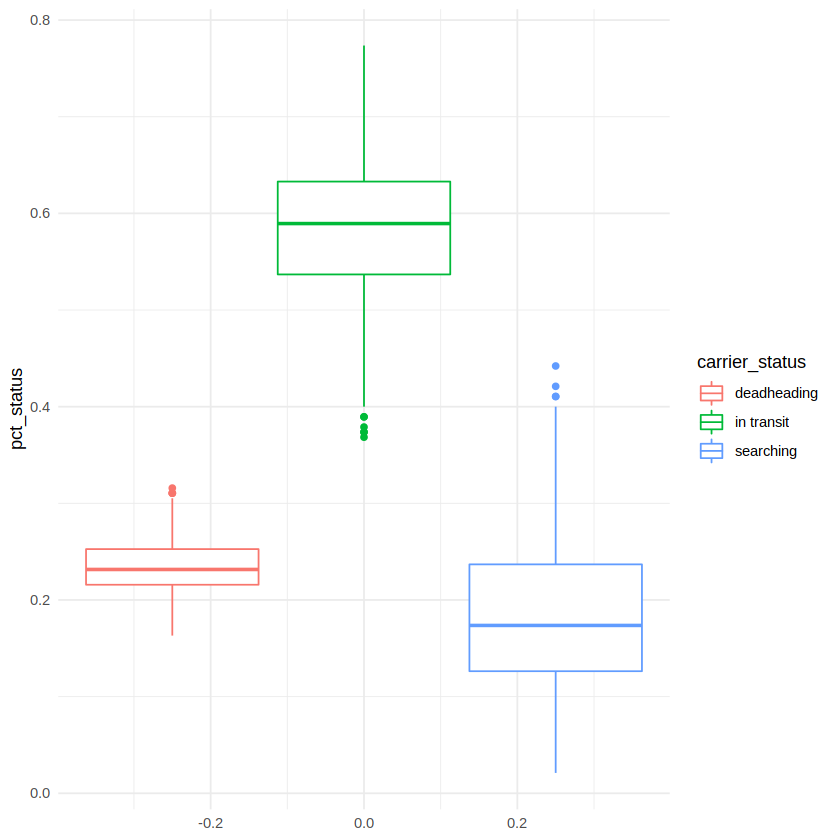

In [57]:
tmp %>%
    filter(agent_type == 'CarrierAgent',
          Step > 5) %>%
    group_by(AgentID, carrier_status) %>%
    summarize(n = n()) %>%
    mutate(pct_status = n / sum(n)) %>%
    ggplot(aes(x = pct_status, color = carrier_status)) +
           geom_boxplot()+
           coord_flip()


In [58]:
tmp %>% 
    filter(agent_type == 'CarrierAgent',
          Step == 50) %>%
    summary()

  agent_type        carrier_loads_moved carrier_status          Step   
 Length:800         Min.   :0.000       Length:800         Min.   :50  
 Class :character   1st Qu.:4.000       Class :character   1st Qu.:50  
 Mode  :character   Median :5.000       Mode  :character   Median :50  
                    Mean   :5.008                          Mean   :50  
                    3rd Qu.:6.000                          3rd Qu.:50  
                    Max.   :9.000                          Max.   :50  
    AgentID        filename        
 Min.   : 50.0   Length:800        
 1st Qu.:149.8   Class :character  
 Median :249.5   Mode  :character  
 Mean   :249.5                     
 3rd Qu.:349.2                     
 Max.   :449.0                     